<a href="https://colab.research.google.com/github/yogendra1109/Road_Extraction_Assigment/blob/main/Road_extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
! pip install patool --quiet
! pip install imgaug --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 kB 2.2 MB/s eta 0:00:00


In [ ]:
import warnings
warnings.filterwarnings('ignore')

import patoolib
import os
import pandas as pd
import cv2 as cv

from tqdm import tqdm
from matplotlib import pyplot as plt

In [ ]:
file_path = '/content/drive/My Drive/Task_Road_extraction/metadata.csv'
data = pd.read_csv(filepath_or_buffer=file_path)

In [ ]:
data.shape

(8570, 4)

In [ ]:
data.head()

,image_id,split,sat_image_path,mask_path
0,100034,train,train/100034_sat.jpg,train/100034_mask.png
1,100081,train,train/100081_sat.jpg,train/100081_mask.png
2,100129,train,train/100129_sat.jpg,train/100129_mask.png
3,100703,train,train/100703_sat.jpg,train/100703_mask.png
4,100712,train,train/100712_sat.jpg,train/100712_mask.png


In [ ]:
data.isnull().sum()

image_id             0
split                0
sat_image_path       0
mask_path         2344
dtype: int64

In [ ]:
data_path = '/content/drive/My Drive/Task_Road_extraction'

In [ ]:
Data_Train = data[data['split'] == 'train']
Data_Valid = data[data['split'] == 'valid']
Data_Test = data[data['split'] == 'test']

In [ ]:
Data_Train.shape

(6226, 4)

In [ ]:
Data_Valid.shape

(1243, 4)

In [ ]:
Data_Test.shape

(1101, 4)

In [ ]:
def show_images(data, split_val, split_col='split', data_path='/content/drive/My Drive/Task_Road_extraction/', limit=5, show_plot=False):
    # split_val → 'train' or 'valid' or 'test'

    split_data = data[data[split_col] == split_val][:limit]

    if (split_val == 'train'):
        sat_images = [data_path + j for j in split_data['sat_image_path'].to_list()]
        mask_images = [data_path + j for j in split_data['mask_path'].to_list()]

        sat_titles = [j.split('/')[-1] for j in sat_images]
        mask_titles = [j.split('/')[-1] for j in mask_images]

        for j in list(range(len(sat_images))):
            # satellite image reading in RGB
            simage = cv.imread(sat_images[j])
            simage = cv.cvtColor(simage, cv.COLOR_BGR2RGB)

            # masked image
            mimage = cv.imread(mask_images[j], cv.IMREAD_UNCHANGED)

            if show_plot:
                plt.figure(figsize=(10, 10))

                plt.subplot(1, 2, 1)
                plt.title(sat_titles[i])
                plt.axis("off")
                plt.imshow(simage)

                plt.subplot(1, 2, 2)
                plt.title(mask_titles[i])
                plt.axis("off")
                plt.imshow(mimage)

                plt.show()

        return None

    # else part
    sat_images = [data_path + j for j in split_data['sat_image_path'].to_list()]
    sat_titles = [j.split('/')[-1] for j in sat_images]

    for j in list(range(len(sat_images))):
        # satellite image reading in RGB
        simage = cv.imread(sat_images[j])
        simage = cv.cvtColor(simage, cv.COLOR_BGR2RGB)

        if show_plot:
            plt.figure(figsize=(5, 5))
            plt.title(sat_titles[j])
            plt.axis("off")
            plt.imshow(simage)
            plt.show()

    return None

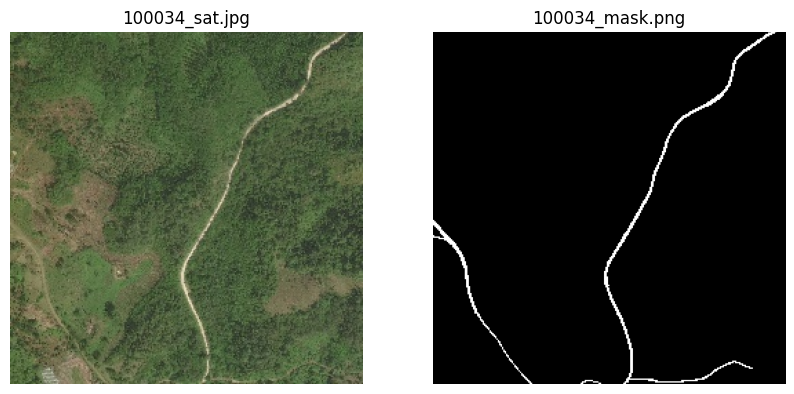

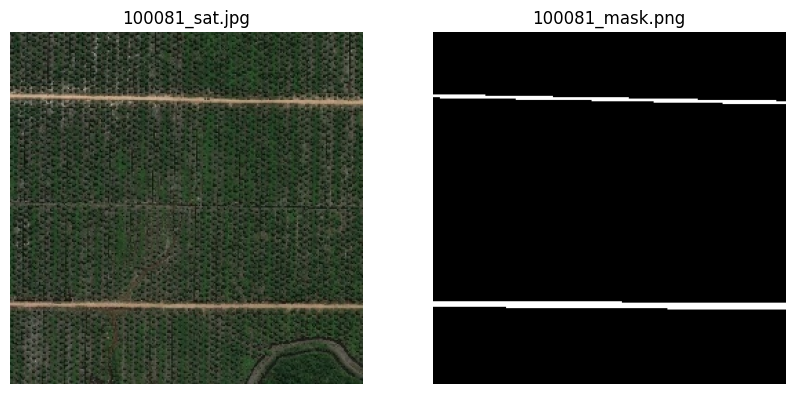

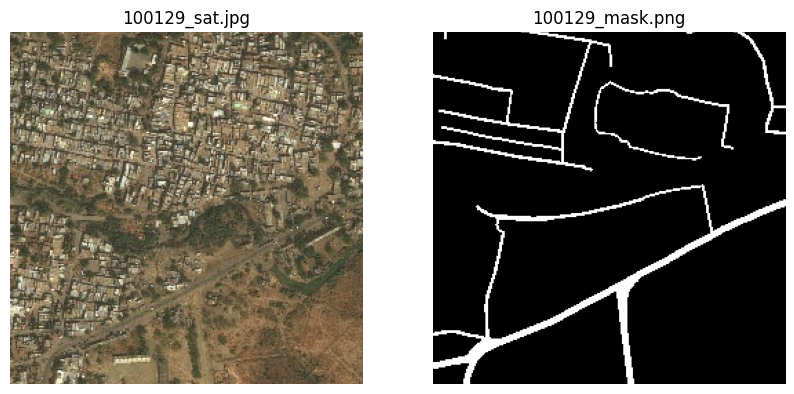

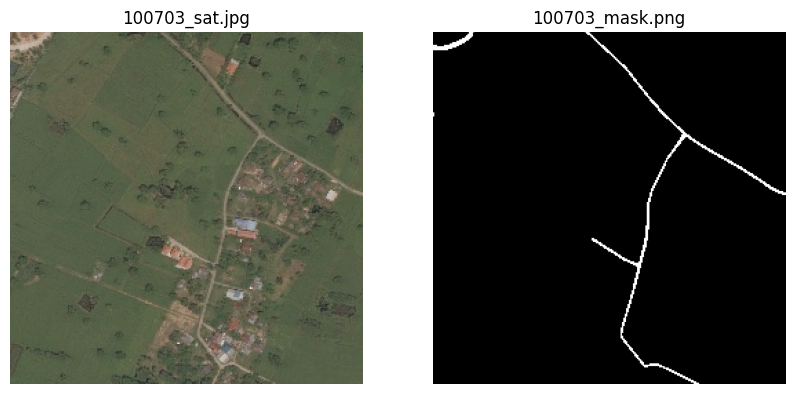

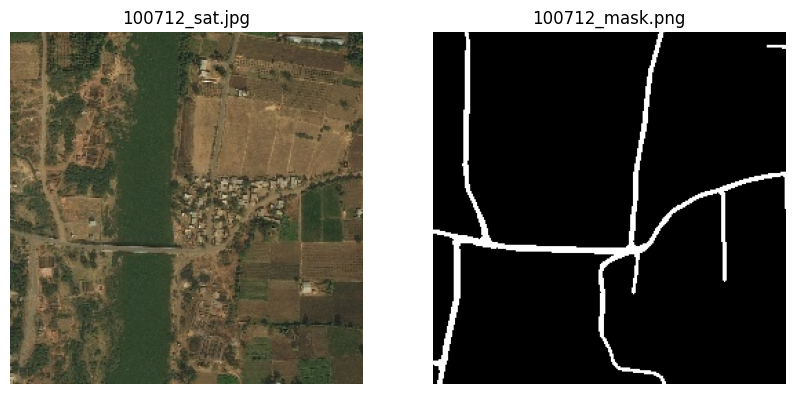

In [ ]:
show_images(data=data, split_val='train', show_plot=True)

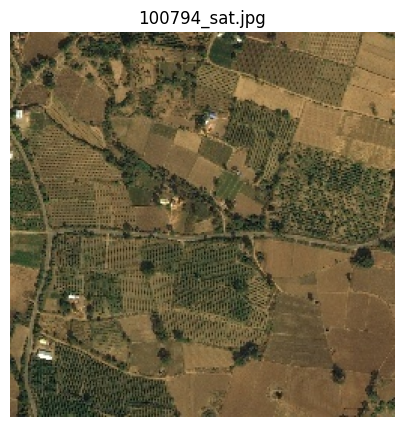

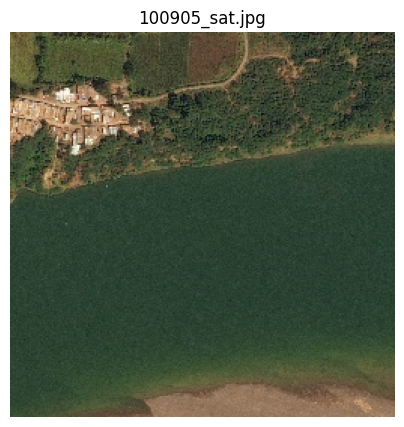

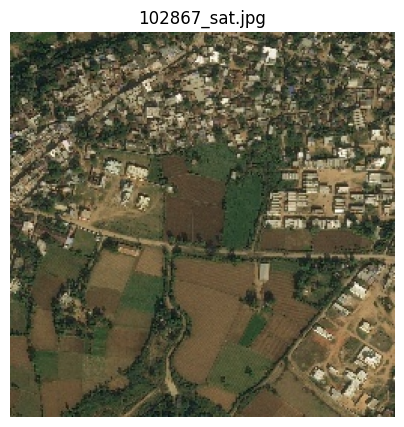

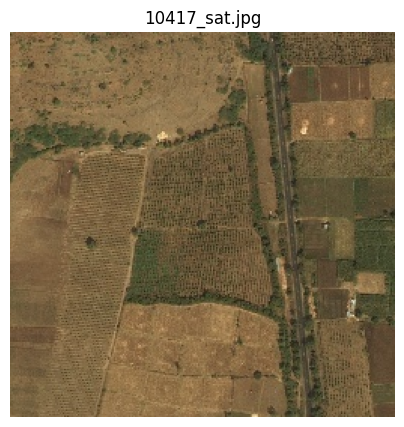

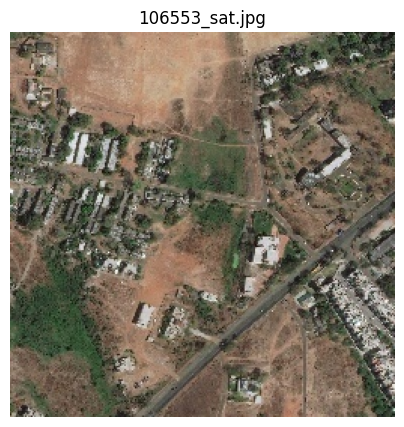

In [ ]:
show_images(data=data, split_val='valid', show_plot=True)

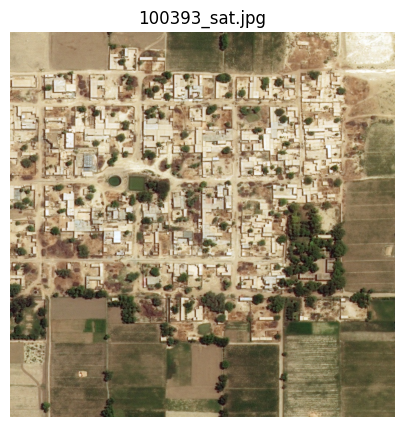

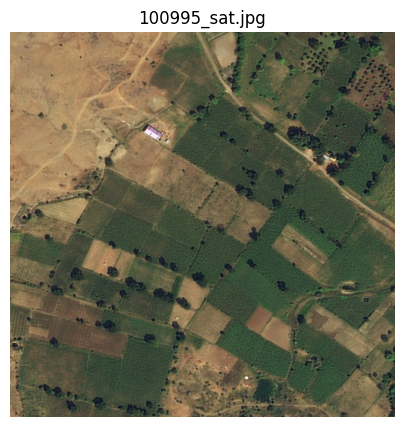

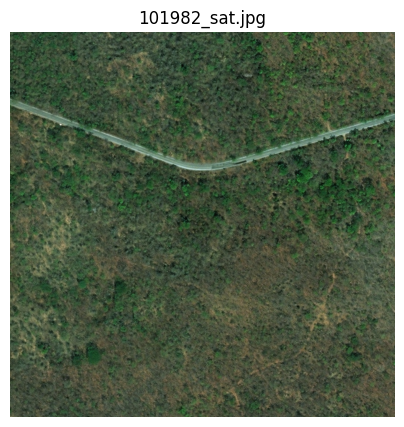

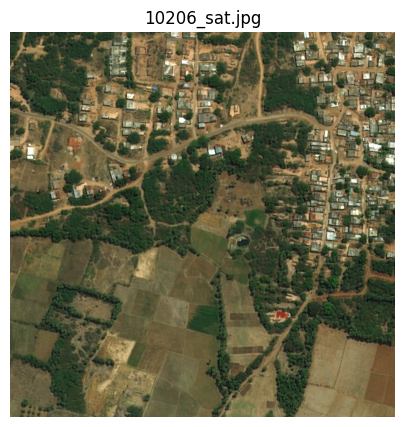

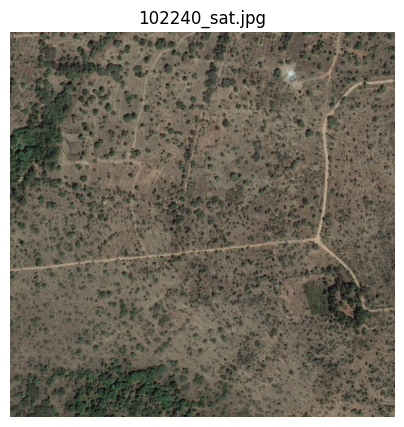

In [ ]:
show_images(data=data, split_val='test', show_plot=True)

In [ ]:
def check_masks(data, split_col='split', split_val='train', limit=5, data_path='/content/drive/My Drive/Task_Road_extraction/', show_plot=False, save_fig=False):
    split_data = data[data[split_col] == split_val][:limit]

    mask_images = [data_path + j for j in split_data['mask_path'].to_list()]
    mask_titles = [j.split('/')[-1] for j in mask_images]

    for j in list(range(len(mask_images))):
        # masked image
        mimage = cv.imread(mask_images[j])
        mimage = cv.cvtColor(mimage, cv.COLOR_BGR2RGB)

        # image binarization
        th, mimage_bin = cv.threshold(src=mimage, thresh=128, maxval=255, type=cv.THRESH_BINARY)

        if show_plot:
            plt.figure(figsize=(10, 10))

            plt.subplot(1, 2, 1)
            plt.title(mask_titles[j])
            plt.axis("off")
            plt.imshow(mimage)

            plt.subplot(1, 2, 2)
            plt.title(mask_titles[j] + '_bin')
            plt.axis("off")
            plt.imshow(mimage_bin)

            plt.show()

        if save_fig:
            cv.imwrite(data_path + 'train/' + mask_titles[j], mimage_bin)

    return None

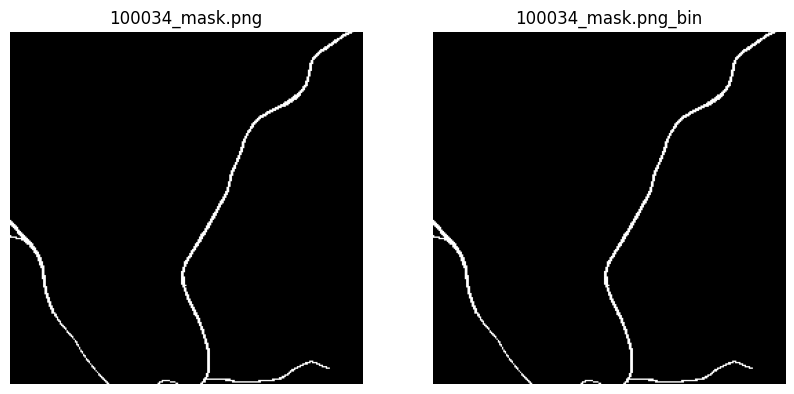

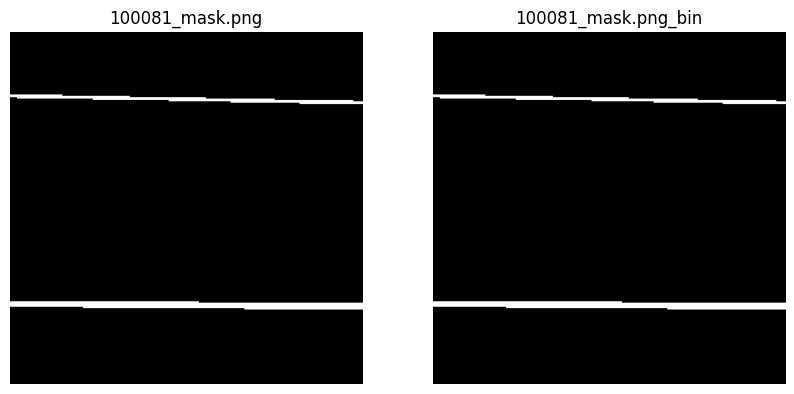

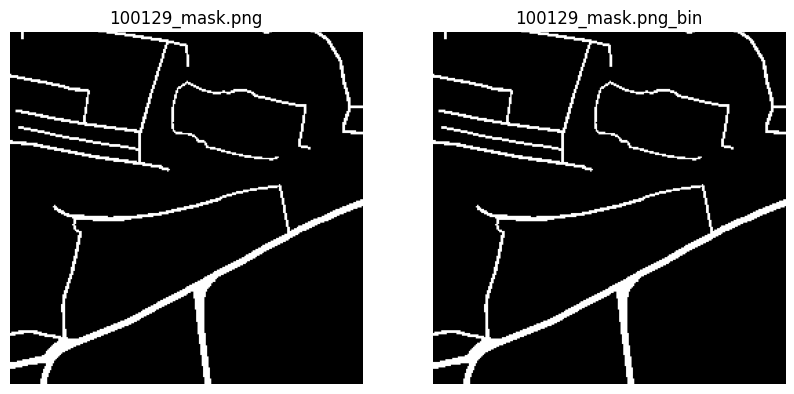

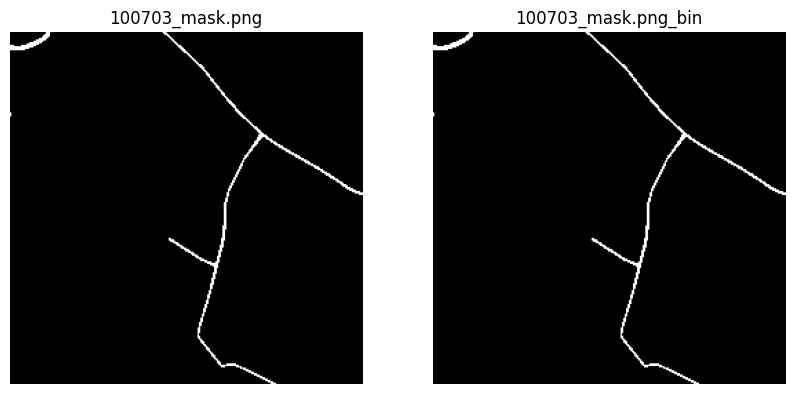

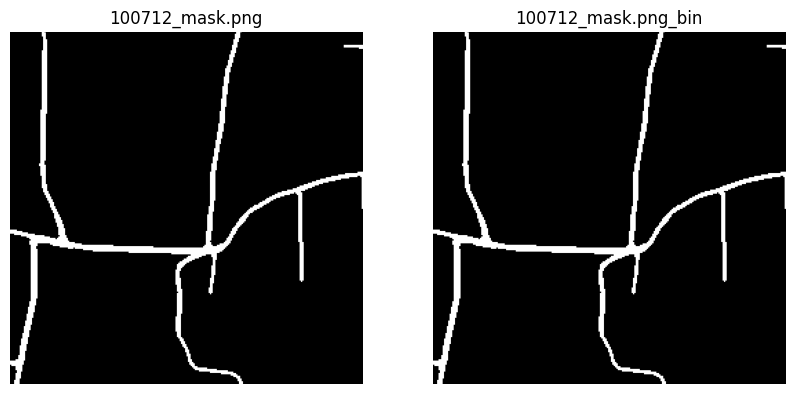

In [ ]:
check_masks(data=data, show_plot=True, save_fig=False)

In [ ]:
#import shutil
#shutil.make_archive('Data_Bin', 'zip', '/content/drive/My Drive/Task_Road_extraction/')

In [ ]:
#! mv /content/Data_Bin.zip /content/drive/MyDrive/Task_Road_extraction/Data_Bin.zip

In [ ]:
#! gdown --id 1HrqTfcL49XDoaA7n4rC0u3sgwO7q2kb7

In [ ]:
def resize_images(data, split_val, split_col='split', data_path='/content/drive/MyDrive/Task_Road_extraction/Data_Bin/', size=256, save_fig=False):
    # split_val → 'train' or 'valid' or 'test'

    split_data = data[data[split_col] == split_val]

    if (split_val == 'train'):
        sat_images = [data_path + j for j in split_data['sat_image_path'].to_list()]
        mask_images = [data_path + j for j in split_data['mask_path'].to_list()]

        sat_titles = [i.split('/')[-1] for j in sat_images]
        mask_titles = [i.split('/')[-1] for j in mask_images]

        print('Saving the train images')
        for j in tqdm(list(range(len(sat_images)))):
            # satellite image reading in RGB
            simage = cv.imread(sat_images[j])
            simage = cv.resize(simage, (size, size), interpolation=cv.INTER_NEAREST)

            # masked image
            mimage = cv.imread(mask_images[j])
            mimage = cv.resize(mimage, (size, size), interpolation=cv.INTER_NEAREST)

            if save_fig:
                cv.imwrite(data_path + 'train/' + sat_titles[j], simage)
                cv.imwrite(data_path + 'train/' + mask_titles[j], mimage)

        return None

    # else part
    sat_images = [data_path + j for j in split_data['sat_image_path'].to_list()]
    sat_titles = [j.split('/')[-1] for j in sat_images]

    print('Saving the {} images'.format(split_val))
    for j in tqdm(list(range(len(sat_images)))):
        # satellite image reading in RGB
        simage = cv.imread(sat_images[j])
        simage = cv.resize(simage, (size, size), interpolation=cv.INTER_NEAREST)

        if save_fig:
            cv.imwrite(data_path + split_val + '/' + sat_titles[j], simage)

    return None

In [ ]:
#resize_images(data=data, split_val='train', save_fig=True)

Saving the train images


100%|██████████| 6226/6226 [58:03<00:00,  1.79it/s]


In [ ]:
#resize_images(data=data, split_val='valid', save_fig=True)

Saving the valid images


100%|██████████| 1243/1243 [05:29<00:00,  3.77it/s]


In [ ]:
#resize_images(data=data, split_val='test', save_fig=True)

Saving the test images


100%|██████████| 1101/1101 [06:35<00:00,  2.78it/s]


In [ ]:
#import shutil
#shutil.make_archive('Data_256', 'zip', '/content/drive/MyDrive/Task_Road_extraction/Data_Bin/')

'/content/Data_256.zip'

In [ ]:
#! mv /content/Data_256.zip /content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256.zip

In [6]:
import os
import patoolib
import pandas as pd
import cv2 as cv
import numpy as np
import tensorflow as tf
import imgaug.augmenters as iaa

from sklearn.model_selection import train_test_split
from skimage.filters import threshold_otsu
from matplotlib import pyplot as plt
from tensorflow.keras.layers import (
    Input,
    Conv2D,
    MaxPooling2D,
    concatenate,
    Conv2DTranspose,
    BatchNormalization,
    Dropout,
    Activation,
    Concatenate
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ModelCheckpoint
)

In [7]:
project_path = '/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256'

In [8]:
file_path = '/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/metadata.csv'
df = pd.read_csv(filepath_or_buffer=file_path)

In [9]:
train_data = data[data['split'] == 'train']
valid_data = data[data['split'] == 'valid']
test_data = data[data['split'] == 'test']

In [15]:
class Dataset:
    def __init__(self, data):
        self.data = data

        # paths of images
        self.sat_images  = self.data['sat_image_path'].to_list()
        # paths of masked images
        self.masks_fps    = self.data['mask_path'].to_list()

    def __getitem__(self, j):

        # read image directly into RGB format
        image = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + self.sat_images[j])
        # read image mask
        image_mask  = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + self.masks_fps[j])
        image_mask = image_mask[:,:,0]

        return image, image_mask

    def __len__(self):
        return len(self.data)

In [16]:
class DataLoder(tf.keras.utils.Sequence):
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

    def __getitem__(self, j):
        # collect batch data
        start = j * self.batch_size
        stop = (j + 1) * self.batch_size

        data = []
        for k in range(start, stop):
            data.append(self.dataset[k])

        batch = [np.stack(samples, axis=0) for samples in zip(*data)]

        return tuple(batch)

    def __len__(self):
        return len(self.indexes) // self.batch_size

    def on_epoch_end(self):
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

In [17]:
## Reference → https://youtu.be/GAYJ81M58y8
## The below code is taken from the above video link. Although I have modified it.
## I give full credit to the author of the video and the creators of UNet.

class UNET:
    # convolution block
    def _convolve(self, input_, filters):
        x = Conv2D(filters=filters, kernel_size=(3, 3), kernel_initializer='he_normal', padding='same')(input_)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)

        x = Conv2D(filters=filters, kernel_size=(3, 3), kernel_initializer='he_normal', padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)

        return x

    # up-sampling and convolotion block
    def _convolve_by_upsampling(self, input_, skip_connector, filters, rate):
        x = Conv2DTranspose(filters=filters, kernel_size=(3, 3), strides=(2, 2), padding='same')(input_)
        x = concatenate([x, skip_connector])
        x = Dropout(rate)(x)
        x = self._convolve(input_=x, filters=filters)
        return x

    # UNET main model
    def unet_main(self, input_, filters=16, rate=0.05):
        # left encoder Path
        c1 = self._convolve(input_=input_, filters=filters)
        p1 = MaxPooling2D(pool_size=(2, 2))(c1)
        p1 = Dropout(rate)(p1)

        c2 = self._convolve(input_=p1, filters=filters * 2)
        p2 = MaxPooling2D(pool_size=(2, 2))(c2)
        p2 = Dropout(rate)(p2)

        c3 = self._convolve(input_=p2, filters=filters * 4)
        p3 = MaxPooling2D(pool_size=(2, 2))(c3)
        p3 = Dropout(rate)(p3)

        c4 = self._convolve(input_=p3, filters=filters * 8)
        p4 = MaxPooling2D(pool_size=(2, 2))(c4)
        p4 = Dropout(rate)(p4)

        # middle bridge
        c5 = self._convolve(input_=p4, filters=filters * 16)

        # right decoder path
        c6 = self._convolve_by_upsampling(input_=c5, skip_connector=c4, filters=filters * 8, rate=rate)
        c7 = self._convolve_by_upsampling(input_=c6, skip_connector=c3, filters=filters * 4, rate=rate)
        c8 = self._convolve_by_upsampling(input_=c7, skip_connector=c2, filters=filters * 2, rate=rate)
        c9 = self._convolve_by_upsampling(input_=c8, skip_connector=c1, filters=filters * 1, rate=rate)

        output_ = Conv2D(filters=1, kernel_size=(1, 1), activation='sigmoid')(c9)

        model = Model(inputs=[input_], outputs=[output_])

        return model

In [18]:
class Modeling:
    def __init__(self, train_data):
        self.train_data = train_data

    def _get_model(self):
        u = UNET()
        inputs = Input(shape=(256, 256, 3))
        model = u.unet_main(input_=inputs)
        return model

    def train_model(self, batch_size=32, model_name='unet_scratch', epochs=25, show_performance=True):
        # since the original validation data does not have masks
        # i am considering `1%` of `train_data` as the `custom_validation`
        # in order to keep track of the model's performance
        self.custom_train, self.custom_valid = train_test_split(self.train_data, test_size=0.1, random_state=42)

        train_dataset = Dataset(df=self.custom_train)
        valid_dataset = Dataset(df=self.custom_valid)

        train_dataloader = DataLoder(train_dataset, batch_size=batch_size, shuffle=True)
        valid_dataloader = DataLoder(valid_dataset, batch_size=batch_size, shuffle=True)

        model = self._get_model()
        # callbacks
        model_path = project_path + 'models/{}.h5'.format(model_name)
        model_save_callback = ModelCheckpoint(
            filepath=model_path,
            save_weights_only=True,
            save_best_only=True,
            mode='max',
            monitor='val_accuracy'
        )
        callbacks = [model_save_callback]

        model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

        if not os.path.isfile(path=model_path):
            tracker = model.fit(
                x=train_dataloader,
                steps_per_epoch=len(train_dataloader),
                epochs=epochs,
                validation_data=valid_dataloader,
                callbacks=callbacks
            )
            model.load_weights(model_path)

            if show_performance:
                self._plot_performance(tracker=tracker, epochs=len(tracker.history['accuracy']))

        else:
            print('Model is already trained and is present in directory.')
            model.load_weights(model_path)

        return model

    def _plot_xy(self, x, y1, y2, yl, xl='epochs'):
        plt.plot(x, y1, label='train')
        plt.plot(x, y2, label='validation')
        plt.xlabel(xl)
        plt.ylabel(yl)
        plt.title('Train VS Validation')
        plt.legend()
        plt.show()
        return None

    def _plot_performance(self, tracker, epochs):
        x = list(range(1, epochs + 1))

        train_iou = tracker.history['accuracy']
        valid_iou = tracker.history['val_accuracy']

        train_loss = tracker.history['loss']
        valid_loss = tracker.history['val_loss']

        self._plot_xy(x=x, y1=train_iou, y2=valid_iou, yl='accuracy')
        self._plot_xy(x=x, y1=train_loss, y2=valid_loss, yl='loss')

        return None

    def plot_custom_valid_performance(self, model, n=10):
        vdata = self.custom_valid.head(n)

        # paths of images
        images_fps   = vdata['sat_image_path'].to_list()
        # paths of masked images
        masks_fps    = vdata['mask_path'].to_list()

        for oimg, mimg in zip(images_fps, masks_fps):
            # original image
            simage = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + oimg)

            # mask image
            mimage = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + mimg)
            mimage = mimage[:,:,0]

            # prediction
            predicted_image  = model.predict(simage[np.newaxis,:,:,:])
            predicted_mask = predicted_image.reshape(simage.shape[0], simage.shape[1])
            # automatic threshold identification
            pmask_thresh = threshold_otsu(predicted_mask)
            # binarizing the mask
            th, predicted_mask = cv.threshold(src=predicted_mask, thresh=pmask_thresh, maxval=255, type=cv.THRESH_BINARY)

            # titles
            image_title = oimg.split('/')[-1]
            mask_title = mimg.split('/')[-1]

            # plotting figure
            plt.figure(figsize=(15, 6))

            plt.subplot(131)
            plt.axis("off")
            plt.title(image_title)
            plt.imshow(simage)

            plt.subplot(132)
            plt.axis("off")
            plt.title(mask_title)
            plt.imshow(mimage, cmap='gray')

            plt.subplot(133)
            plt.axis("off")
            plt.title("Prediction - {}".format(image_title))
            plt.imshow(predicted_mask, cmap='gray')

            plt.show()

        return None

    def extract_road_path(self, x, model, n=10):
        x_ = x.head(n)

        # paths of images
        images_fps   = x_['sat_image_path'].to_list()
        # paths of masked images
        masks_fps    = x_['mask_path'].to_list()

        for oimg, mimg in zip(images_fps, masks_fps):
            # original image
            simage = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + oimg)

            # prediction
            predicted_image  = model.predict(simage[np.newaxis,:,:,:])
            predicted_mask = predicted_image.reshape(simage.shape[0], simage.shape[1])
            # automatic threshold identification
            pmask_thresh = threshold_otsu(predicted_mask)
            # binarizing the mask
            th, predicted_mask = cv.threshold(src=predicted_mask, thresh=pmask_thresh, maxval=255, type=cv.THRESH_BINARY)
            image_title = oimg.split('/')[-1]

            plt.figure(figsize=(10, 6))

            plt.subplot(121)
            plt.axis("off")
            plt.title(image_title)
            plt.imshow(simage)

            plt.subplot(122)
            plt.axis("off")
            plt.title("Prediction - {}".format(image_title))
            plt.imshow(predicted_mask, cmap='gray')

            plt.show()

        return None

In [17]:
Y = Modeling(train_data=train_data)

In [18]:
model = Y.train_model()

Model is already trained and is present in directory.


In [ ]:
Y.plot_custom_valid_performance(model=model)

1/1 [==============================] - 0s 438ms/step


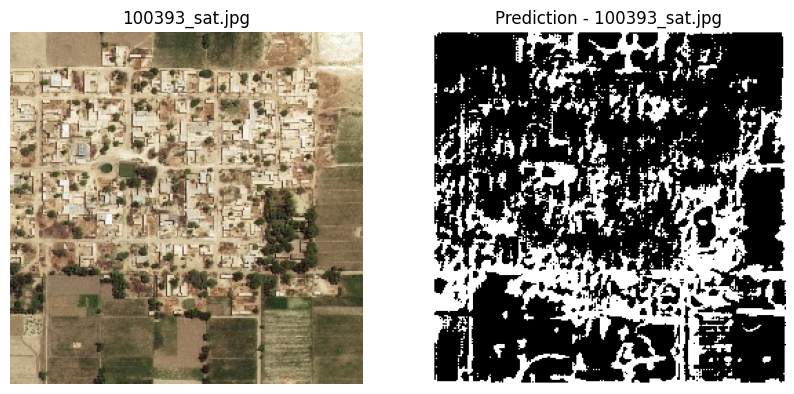

1/1 [==============================] - 0s 68ms/step


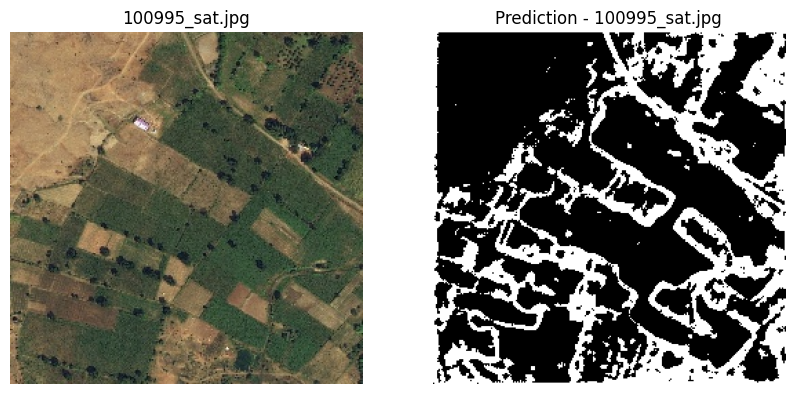

1/1 [==============================] - 0s 68ms/step


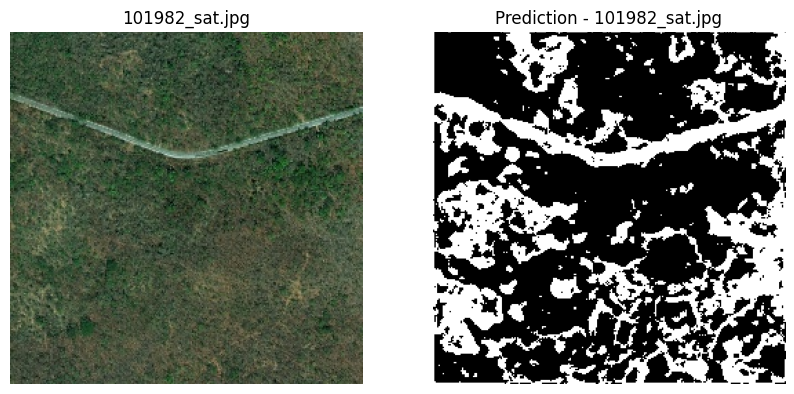

1/1 [==============================] - 0s 67ms/step


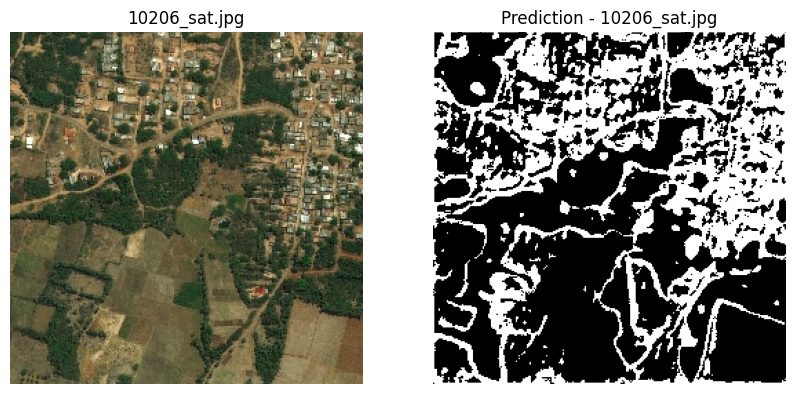

1/1 [==============================] - 0s 67ms/step


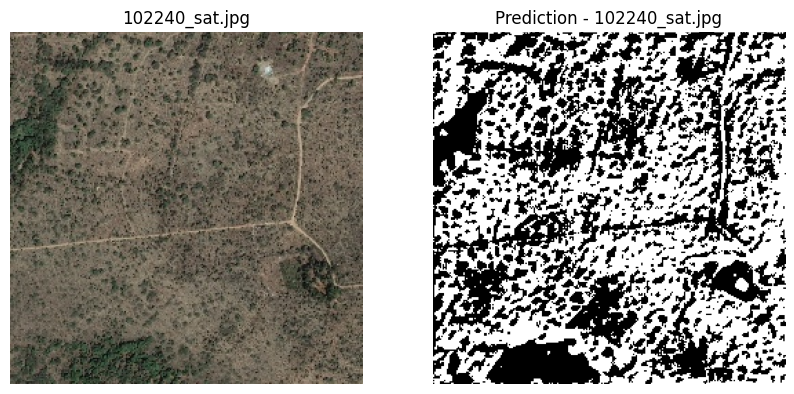

1/1 [==============================] - 0s 65ms/step


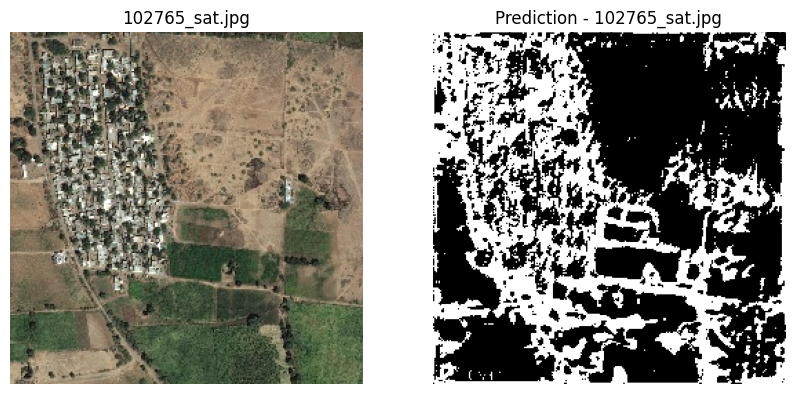

1/1 [==============================] - 0s 64ms/step


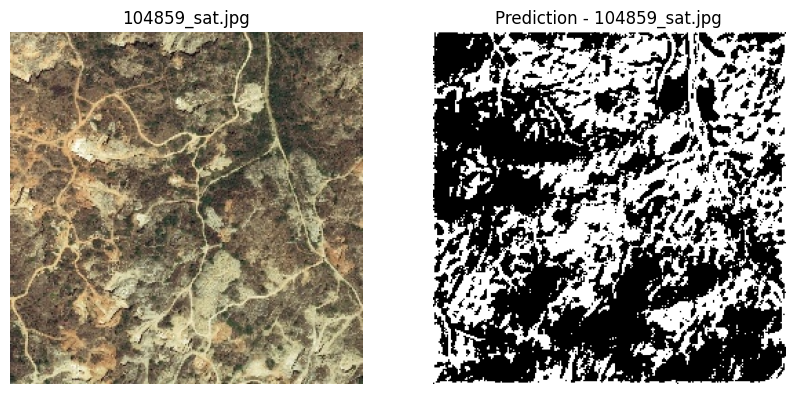

1/1 [==============================] - 0s 69ms/step


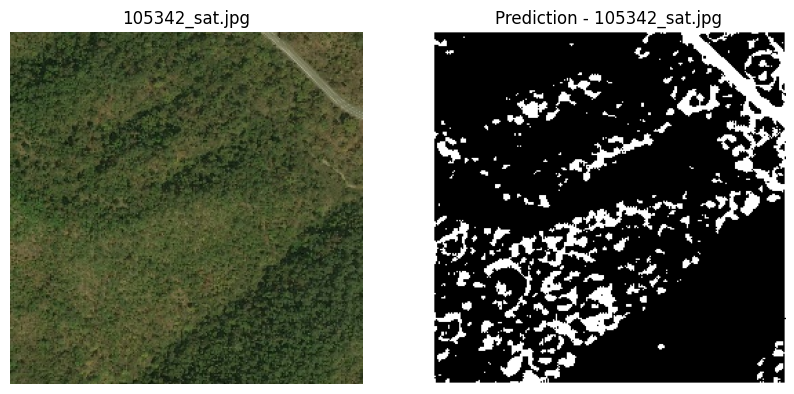

1/1 [==============================] - 0s 65ms/step


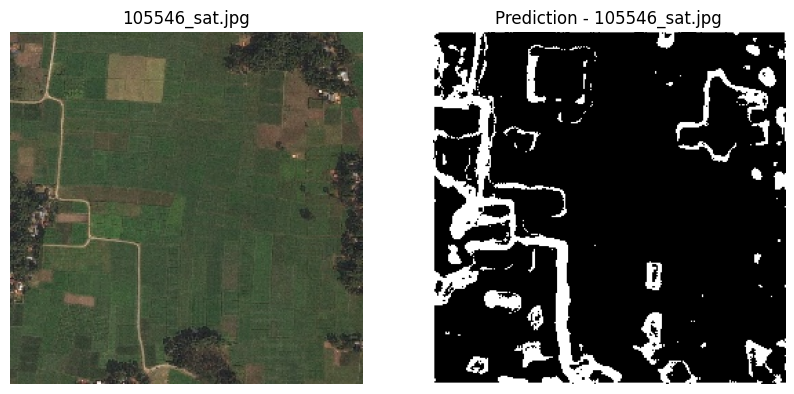

1/1 [==============================] - 0s 70ms/step


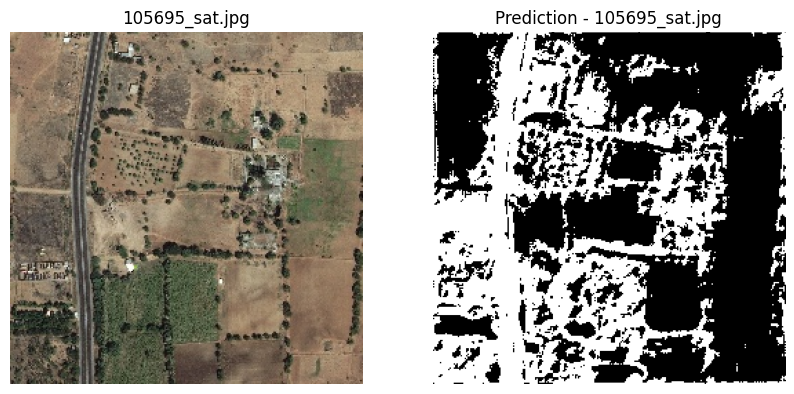

In [19]:
Y.extract_road_path(x=test_data, model=model)

In [19]:
aug2 = iaa.Fliplr(1)
aug3 = iaa.Flipud(1)

In [20]:
class DatasetAugment:
    def __init__(self, data):
        self.data = data

        # paths of images
        self.sat_images  = self.data['sat_image_path'].to_list()
        # paths of masked images
        self.masks_fps    = self.data['mask_path'].to_list()

    def __getitem__(self, j):

        # read image directly into RGB format
        image = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + self.sat_images[j])
        # read image mask
        image_mask  = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + self.masks_fps[j])
        image_mask = image_mask[:,:,0]

        a = np.random.uniform()
        if (a <= 0.5):
            image = aug2.augment_image(image)
            image_mask = aug2.augment_image(image_mask)
        else:
            image = aug3.augment_image(image)
            image_mask = aug3.augment_image(image_mask)

        return image, image_mask

    def __len__(self):
        return len(self.data)

In [21]:
class ModelingAugmentation:
    def __init__(self, train_data):
        self.train_data = train_data

    def _get_model(self):
        u = UNET()
        inputs = Input(shape=(256, 256, 3))
        model = u.unet_main(input_=inputs)
        return model

    def train_model(self, batch_size=32, model_name='unet_scratch_augmentated', epochs=25, show_performance=True):
        # since the original validation data does not have masks
        # i am considering `1%` of `train_data` as the `custom_validation`
        # in order to keep track of the model's performance
        self.custom_train, self.custom_valid = train_test_split(self.train_data, test_size=0.1, random_state=42)

        train_dataset = DatasetAugment(data=self.custom_train)
        valid_dataset = DatasetAugment(data=self.custom_valid)

        train_dataloader = DataLoder(train_dataset, batch_size=batch_size, shuffle=True)
        valid_dataloader = DataLoder(valid_dataset, batch_size=batch_size, shuffle=True)

        model = self._get_model()
        # callbacks
        model_path = project_path + 'models/{}.h5'.format(model_name)
        model_save_callback = ModelCheckpoint(
            filepath=model_path,
            save_weights_only=True,
            save_best_only=True,
            mode='max',
            monitor='val_accuracy'
        )
        callbacks = [model_save_callback]

        model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

        if not os.path.isfile(path=model_path):
            tracker = model.fit(
                x=train_dataloader,
                steps_per_epoch=len(train_dataloader),
                epochs=epochs,
                validation_data=valid_dataloader,
                callbacks=callbacks
            )
            model.load_weights(model_path)

            if show_performance:
                self._plot_performance(tracker=tracker, epochs=len(tracker.history['accuracy']))

        else:
            print('Model is already trained and is present in directory.')
            model.load_weights(model_path)

        return model

    def _plot_xy(self, x, y1, y2, yl, xl='epochs'):
        plt.plot(x, y1, label='train')
        plt.plot(x, y2, label='validation')
        plt.xlabel(xl)
        plt.ylabel(yl)
        plt.title('Train VS Validation')
        plt.legend()
        plt.show()
        return None

    def _plot_performance(self, tracker, epochs):
        x = list(range(1, epochs + 1))

        train_iou = tracker.history['accuracy']
        valid_iou = tracker.history['val_accuracy']

        train_loss = tracker.history['loss']
        valid_loss = tracker.history['val_loss']

        self._plot_xy(x=x, y1=train_iou, y2=valid_iou, yl='accuracy')
        self._plot_xy(x=x, y1=train_loss, y2=valid_loss, yl='loss')

        return None

    def plot_custom_valid_performance(self, model, n=10):
        vdata = self.custom_valid.head(n)

        # paths of images
        images_fps   = vdata['sat_image_path'].to_list()
        # paths of masked images
        masks_fps    = vdata['mask_path'].to_list()

        for oimg, mimg in zip(images_fps, masks_fps):
            # original image
            simage = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + oimg)

            # mask image
            mimage = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + mimg)
            mimage = mimage[:,:,0]

            # prediction
            predicted_image  = model.predict(simage[np.newaxis,:,:,:])
            predicted_mask = predicted_image.reshape(simage.shape[0], simage.shape[1])
            # automatic threshold identification
            pmask_thresh = threshold_otsu(predicted_mask)
            # binarizing the mask
            th, predicted_mask = cv.threshold(src=predicted_mask, thresh=pmask_thresh, maxval=255, type=cv.THRESH_BINARY)

            # titles
            image_title = oimg.split('/')[-1]
            mask_title = mimg.split('/')[-1]

            # plotting figure
            plt.figure(figsize=(15, 6))

            plt.subplot(131)
            plt.axis("off")
            plt.title(image_title)
            plt.imshow(simage)

            plt.subplot(132)
            plt.axis("off")
            plt.title(mask_title)
            plt.imshow(mimage, cmap='gray')

            plt.subplot(133)
            plt.axis("off")
            plt.title("Prediction - {}".format(image_title))
            plt.imshow(predicted_mask, cmap='gray')

            plt.show()

        return None

    def extract_road_path(self, x, model, n=10):
        x_ = x.head(n)

        # paths of images
        images_fps   = x_['sat_image_path'].to_list()
        # paths of masked images
        masks_fps    = x_['mask_path'].to_list()

        for oimg, mimg in zip(images_fps, masks_fps):
            # original image
            simage = plt.imread('/content/drive/MyDrive/Task_Road_extraction/Data_Bin/Data_256/' + oimg)

            # prediction
            predicted_image  = model.predict(simage[np.newaxis,:,:,:])
            predicted_mask = predicted_image.reshape(simage.shape[0], simage.shape[1])
            # automatic threshold identification
            pmask_thresh = threshold_otsu(predicted_mask)
            # binarizing the mask
            th, predicted_mask = cv.threshold(src=predicted_mask, thresh=pmask_thresh, maxval=255, type=cv.THRESH_BINARY)
            image_title = oimg.split('/')[-1]

            plt.figure(figsize=(10, 6))

            plt.subplot(121)
            plt.axis("off")
            plt.title(image_title)
            plt.imshow(simage)

            plt.subplot(122)
            plt.axis("off")
            plt.title("Prediction - {}".format(image_title))
            plt.imshow(predicted_mask, cmap='gray')

            plt.show()

        return None

In [22]:
Z = ModelingAugmentation(train_data=train_data)

In [23]:
model_a = Z.train_model()

Model is already trained and is present in directory.


1/1 [==============================] - 1s 920ms/step


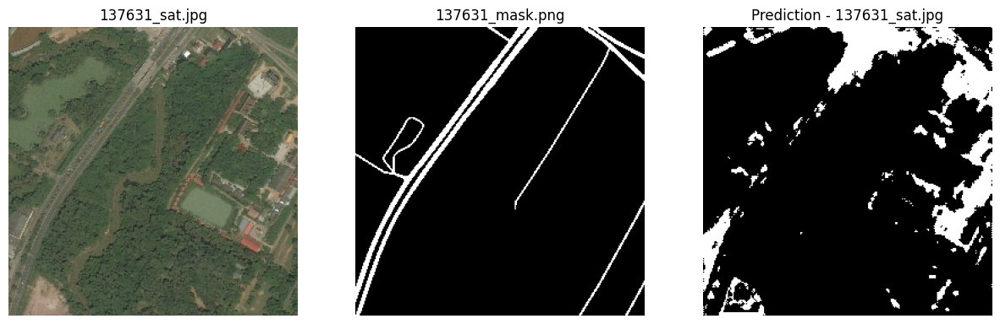

1/1 [==============================] - 0s 349ms/step


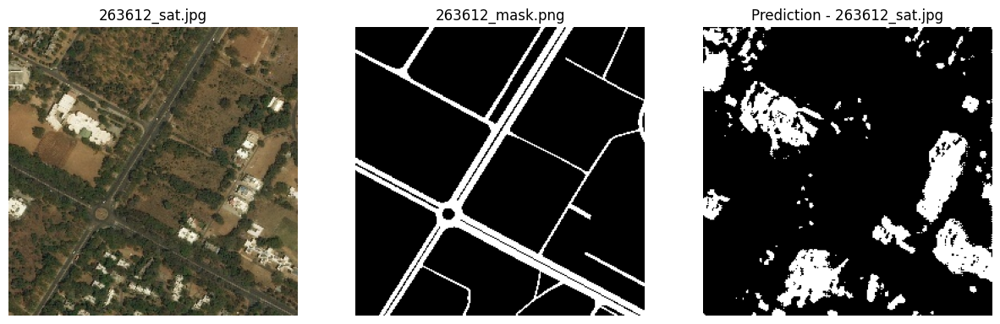

1/1 [==============================] - 0s 204ms/step


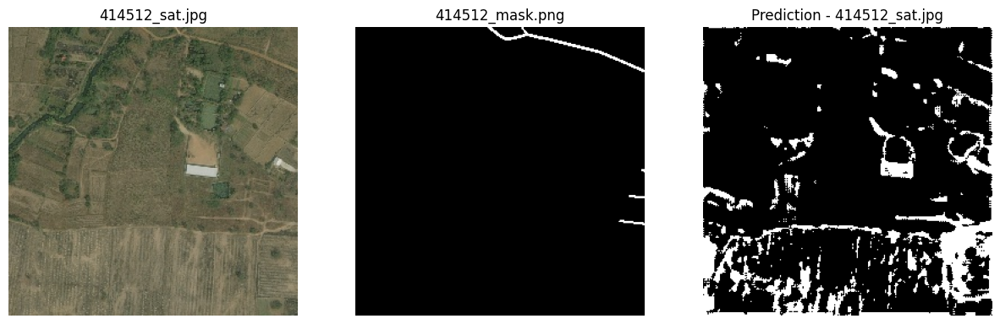

1/1 [==============================] - 0s 184ms/step


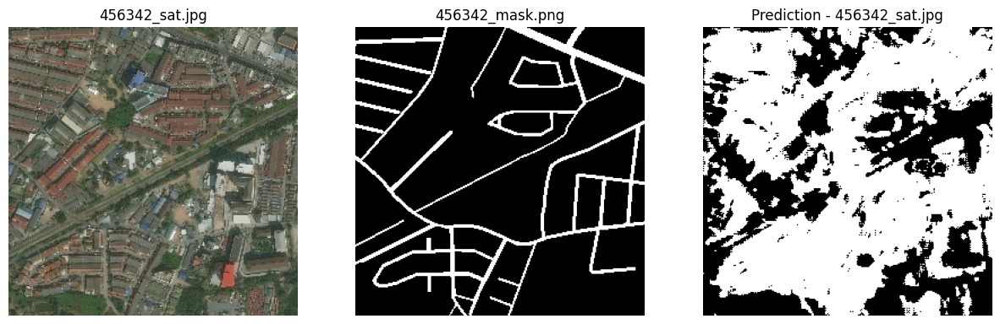

1/1 [==============================] - 0s 187ms/step


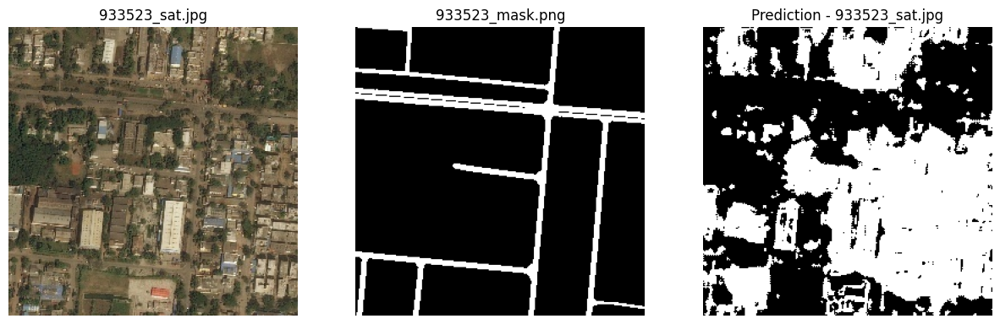

1/1 [==============================] - 0s 201ms/step


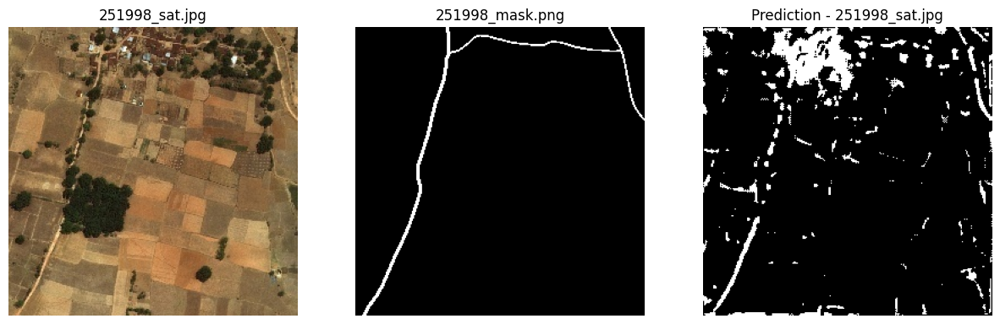

1/1 [==============================] - 0s 211ms/step


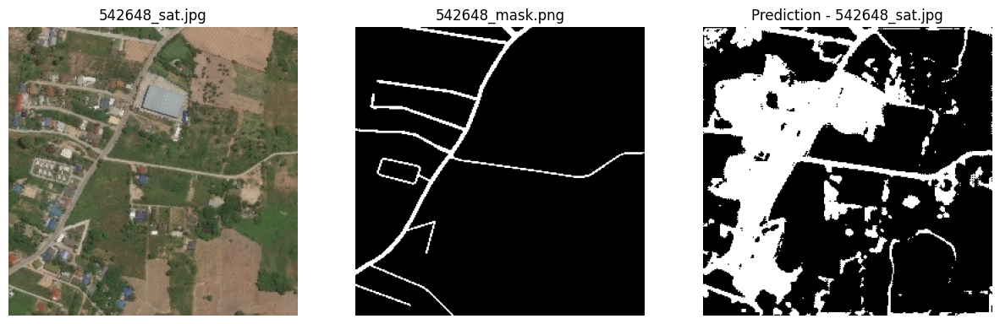

1/1 [==============================] - 0s 185ms/step


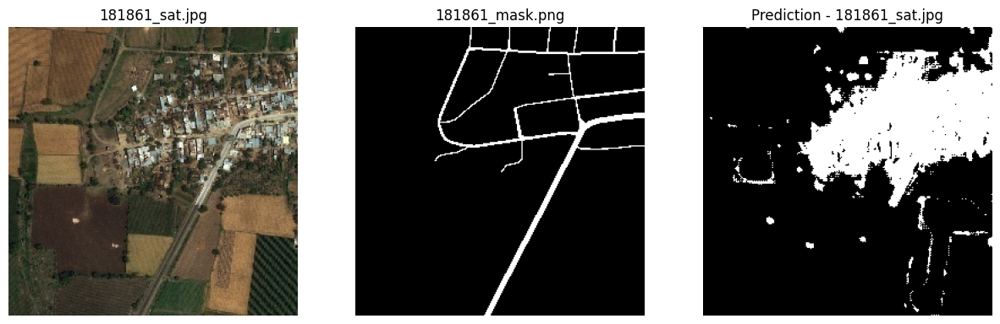

1/1 [==============================] - 0s 193ms/step


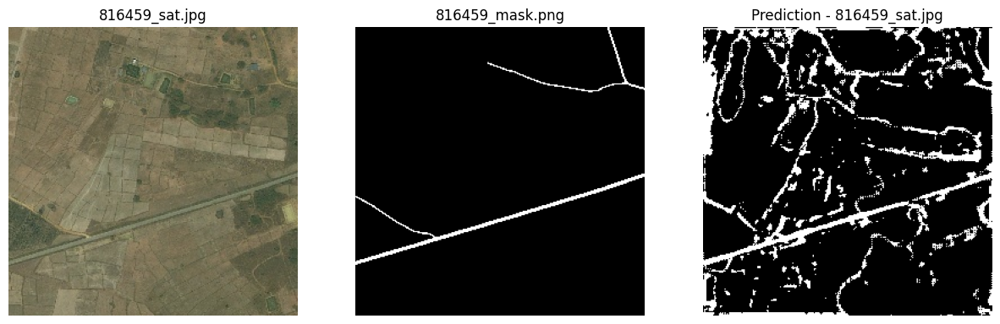

1/1 [==============================] - 0s 187ms/step


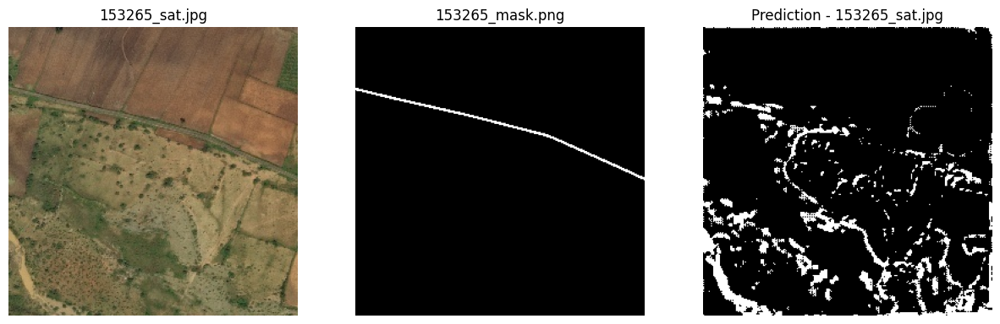

In [24]:
Z.plot_custom_valid_performance(model=model_a)

1/1 [==============================] - 0s 305ms/step


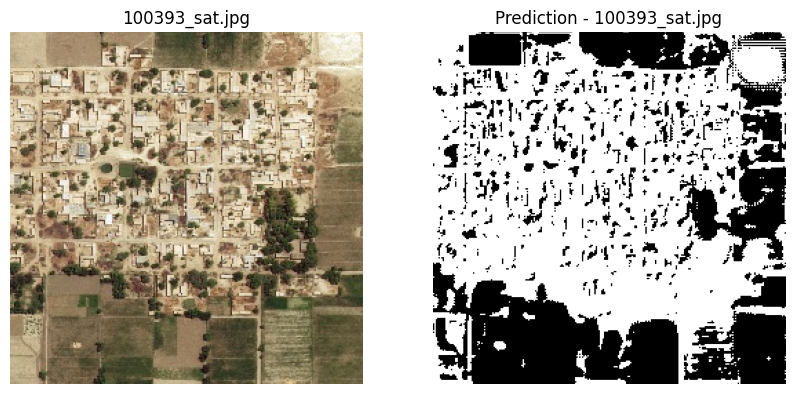

1/1 [==============================] - 0s 206ms/step


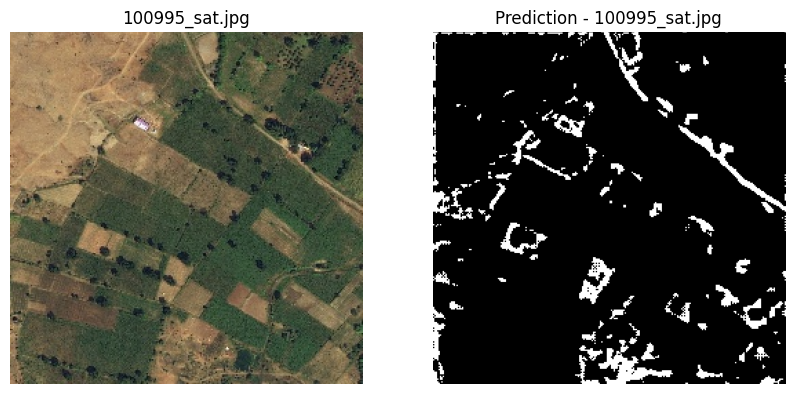

1/1 [==============================] - 0s 191ms/step


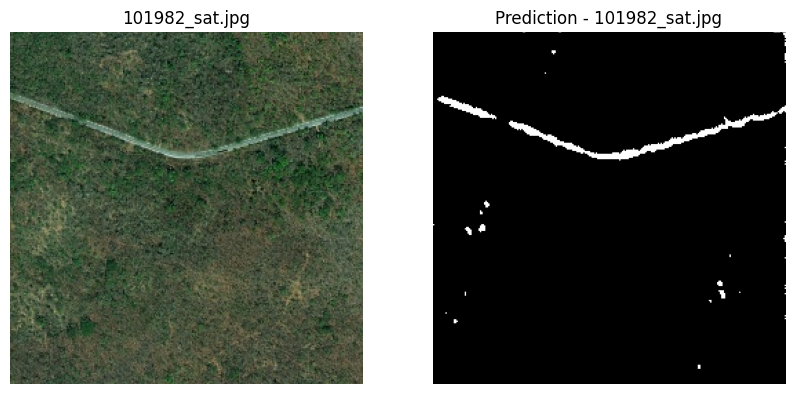

1/1 [==============================] - 0s 198ms/step


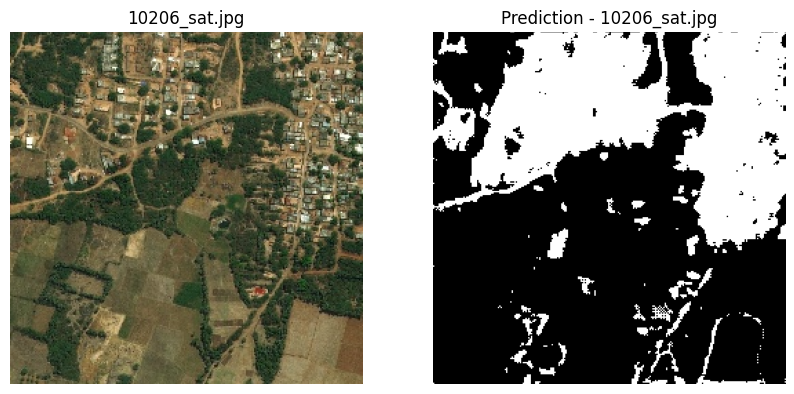

1/1 [==============================] - 0s 189ms/step


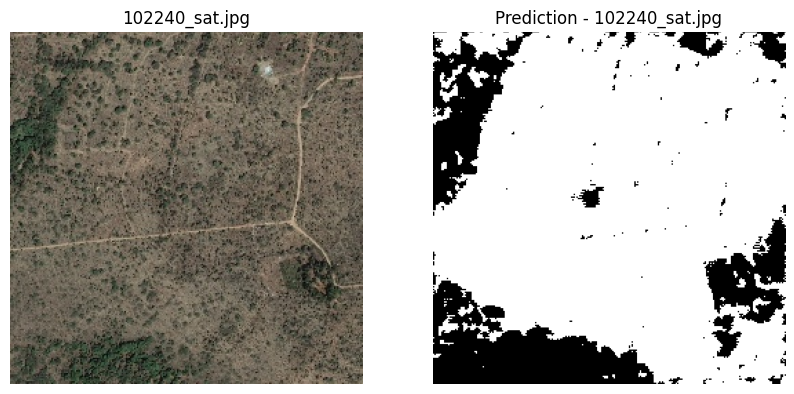

1/1 [==============================] - 0s 237ms/step


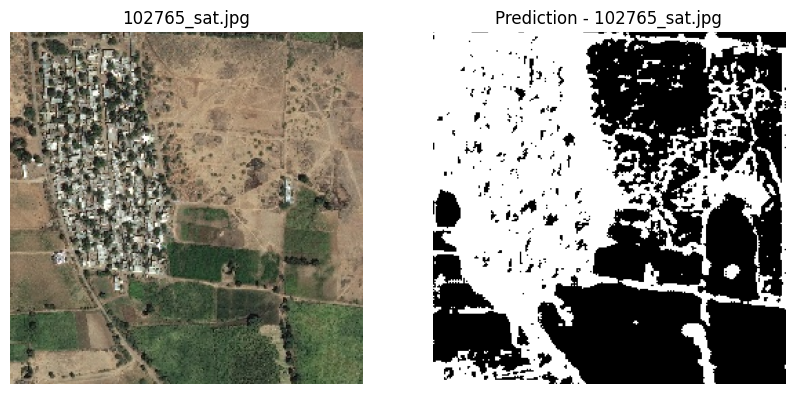

1/1 [==============================] - 0s 222ms/step


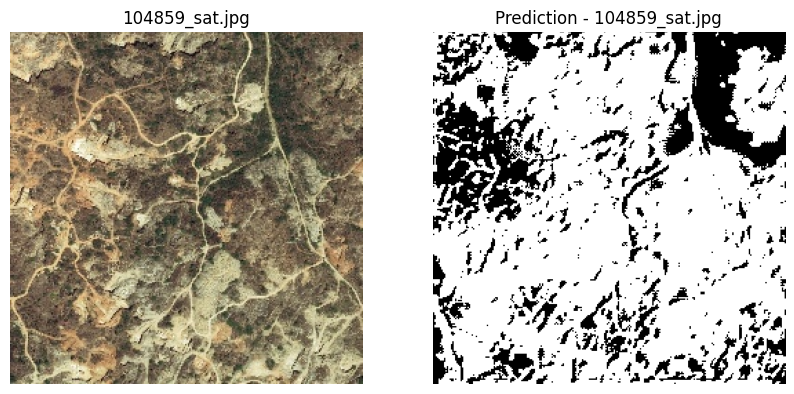

1/1 [==============================] - 0s 335ms/step


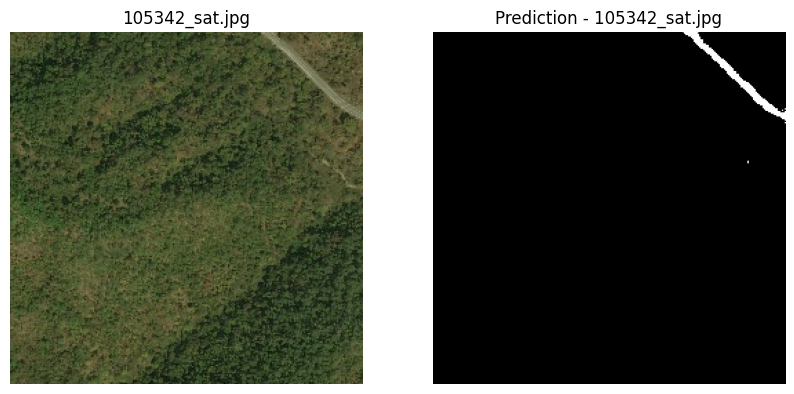

1/1 [==============================] - 0s 333ms/step


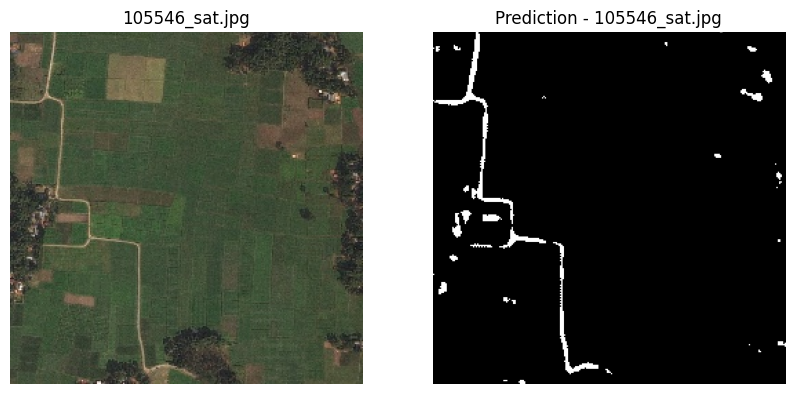

1/1 [==============================] - 0s 359ms/step


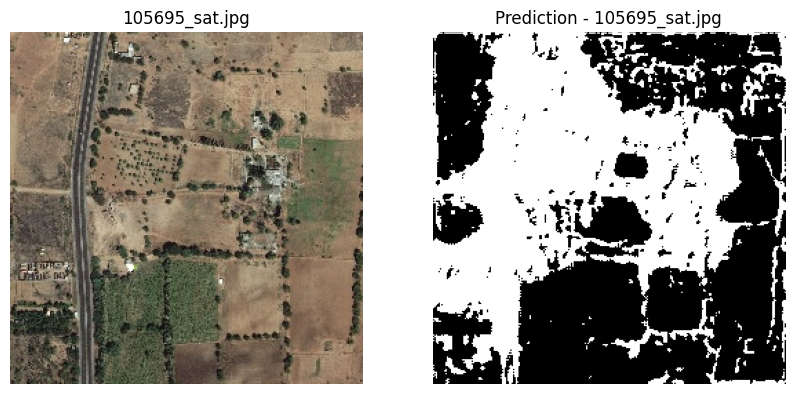

In [25]:
Z.extract_road_path(x=test_data, model=model_a)